In [1]:
import kagglehub
overvisual_vn_handwritten_images_path = kagglehub.dataset_download('overvisual/vn-handwritten-images')

print('Data source import complete.')

100%|██████████| 356M/356M [00:06<00:00, 61.8MB/s]

Extracting files...


Data source import complete.


In [2]:
import json

# Mở file json chứa nhãn dữ liệu huấn luyện
with open('/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/labels.json', 'r', encoding='utf8') as f:
    train_labels = json.load(f)

In [3]:
print(train_labels['0015_samples.png'])

Phố 2, Huyện Bá Thước, Thanh Hoá


In [4]:
char_list = set()

for label in train_labels.values():
    char_list.update(set(label))  # Thêm tất cả các ký tự trong nhãn vào tập hợp (loại bỏ trùng lặp tự động)

# Sắp xếp danh sách ký tự theo thứ tự bảng chữ cái để đảm bảo tính nhất quán
char_list = sorted(char_list)

len(char_list)

140

In [5]:
# Nối tất cả các ký tự trong danh sách char_list thành một chuỗi duy nhất
"".join(char_list)

" #'()+,-./0123456789:ABCDEFGHIJKLMNOPQRSTUVWXYabcdeghiklmnopqrstuvwxyzÂÊÔàáâãèéêìíòóôõùúýăĐđĩũƠơưạảấầẩậắằẵặẻẽếềểễệỉịọỏốồổỗộớờởỡợụủỨứừửữựỳỵỷỹ"

In [6]:
def encode_to_labels(txt):
    # Khởi tạo danh sách rỗng để lưu các chỉ số của ký tự
    dig_lst = []

    # Lặp qua từng ký tự trong chuỗi đầu vào `txt`
    for index, char in enumerate(txt):
        try:
            # Tìm vị trí của ký tự trong char_list và thêm vào dig_lst
            dig_lst.append(char_list.index(char))
        except:
            # Nếu ký tự không có trong char_list, in ra thông báo lỗi
            print("Not found in char_list:", char)

    # Trả về danh sách các chỉ số tương ứng với ký tự trong chuỗi đầu vào
    return dig_lst

In [7]:
encode_to_labels("Giáp")

[27, 53, 74, 59]

In [8]:
import pathlib

train_image_paths = []

raw_folder_path = '/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data'

# Kiểm tra xem thư mục có tồn tại hay không
if pathlib.Path(raw_folder_path).exists():
    # Lặp qua toàn bộ file và thư mục con trong thư mục chính
    for item in pathlib.Path(raw_folder_path).glob('**/*'):
        # Kiểm tra nếu item là một file và không phải file JSON
        if item.is_file() and item.suffix not in ['.json']:
            train_image_paths.append(str(item))  # Chuyển đường dẫn sang dạng chuỗi và thêm vào danh sách
else:
    print("Thư mục không tồn tại hoặc đường dẫn không chính xác.")  # In ra thông báo nếu đường dẫn không hợp lệ

In [9]:
print(len(train_image_paths))
train_image_paths[:10]

1838


['/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/1680_samples.png',
 '/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/1115_samples.png',
 '/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/0694_samples.png',
 '/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/1401_samples.png',
 '/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/1683_samples.png',
 '/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/1721_samples.png',
 '/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/0604_samples.png',
 '/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/1166_samples.png',
 '/root/

In [10]:
import os
import pathlib
import json  # Import thư viện để xử lý file JSON

# Đường dẫn đến thư mục chứa dữ liệu và file labels.json
RAW_FOLDER = '/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images'

# Đọc dữ liệu nhãn từ file labels.json
try:
    with open(os.path.join(RAW_FOLDER, 'labels.json'), 'r', encoding='utf8') as f:
        train_labels = json.load(f)  # Load dữ liệu JSON vào dictionary
except FileNotFoundError:
    print("Tệp labels.json không tìm thấy. Hãy kiểm tra lại đường dẫn.")  # Xử lý lỗi khi file không tồn tại
except NotADirectoryError:
    print("Phần của đường dẫn được cung cấp không phải là một thư mục.")  # Xử lý lỗi nếu đường dẫn không hợp lệ

# Tạo từ điển để ánh xạ đường dẫn tệp ảnh với nhãn tương ứng
dict_filepath_label = {}  # Khởi tạo từ điển rỗng
raw_data_path = pathlib.Path(RAW_FOLDER)  # Chuyển đường dẫn thành đối tượng Path

try:
    # Lặp qua tất cả các file trong thư mục (bao gồm thư mục con)
    for item in raw_data_path.glob('**/*.*'):
        file_name = str(os.path.basename(item))  # Lấy tên file từ đường dẫn
        if file_name != "labels.json":  # Bỏ qua file JSON chứa nhãn
            label = train_labels.get(file_name, None)  # Lấy nhãn tương ứng với file ảnh
            if label is not None:
                dict_filepath_label[str(item)] = label  # Lưu đường dẫn file và nhãn vào dictionary
except FileNotFoundError:
    print("Không tìm thấy thư mục hoặc tệp. Hãy kiểm tra lại đường dẫn.")  # Xử lý lỗi nếu thư mục không tồn tại

In [11]:
# Hiển thị 10 cặp đầu tiên từ dictionary
list_dict_filepath_label = list(dict_filepath_label.items())
first_10_pairs = list_dict_filepath_label[:10]

for path, label in first_10_pairs:
    print(f'Đường dẫn: {path}, Nhãn: {label}')

Đường dẫn: /root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/1680_samples.png, Nhãn: ấp Vĩnh Quới, xã Vĩnh An, Huyện Châu Thành, An Giang
Đường dẫn: /root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/1115_samples.png, Nhãn: 15 Cây Keo, Phường Hiệp Tân, Quận Tân phú, TP Hồ Chí Minh
Đường dẫn: /root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/0694_samples.png, Nhãn: 555C Trường Chinh, Phường An Khê, Quận Thanh Khê, Đà Nẵng
Đường dẫn: /root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/1401_samples.png, Nhãn: 57- Lê Văn Sĩ, Phường Hoà Minh, Quận Liên Chiểu, Đà Nẵng
Đường dẫn: /root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/1683_samples.png, Nhãn: 49, đường 3/2, KV2, Phường V, Tp Vị Thanh, Hậu Giang
Đường dẫn: /root/.cache/kaggleh

In [12]:
# Tạo danh sách để lưu độ dài của từng nhãn
label_lens = []

# Lặp qua tất cả các nhãn trong từ điển dict_filepath_label
for label in dict_filepath_label.values():
    label_lens.append(len(label))  # Lưu độ dài của từng nhãn vào danh sách

# Tìm độ dài lớn nhất trong danh sách
max_label_len = max(label_lens)

# In ra độ dài nhãn dài nhất
max_label_len

69

In [13]:
#Trích xuất tất cả đường dẫn ảnh từ từ điển dict_filepath_label
all_image_paths = list(dict_filepath_label.keys())

In [14]:
all_image_paths[:10]

['/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/1680_samples.png',
 '/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/1115_samples.png',
 '/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/0694_samples.png',
 '/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/1401_samples.png',
 '/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/1683_samples.png',
 '/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/1721_samples.png',
 '/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/0604_samples.png',
 '/root/.cache/kagglehub/datasets/overvisual/vn-handwritten-images/versions/1/vn_handwritten_images/data/1166_samples.png',
 '/root/

In [15]:
import cv2  # Thư viện xử lý ảnh OpenCV

# Tạo danh sách lưu chiều rộng và chiều cao của ảnh
widths = []
heights = []

# Lặp qua tất cả các đường dẫn ảnh trong tập dữ liệu
for image_path in all_image_paths:
    img = cv2.imread(image_path)  # Đọc ảnh từ đường dẫn
    (height, width, _) = img.shape  # Lấy kích thước ảnh (chiều cao, chiều rộng, số kênh màu)
    heights.append(height)  # Lưu chiều cao vào danh sách
    widths.append(width)  # Lưu chiều rộng vào danh sách

In [16]:
min_height = min(heights)
max_height = max(heights)
min_width = min(widths)
max_width = max(widths)

In [17]:
# Xác định kích thước nhỏ nhất và lớn nhất của ảnh
(min_height, max_height, min_width, max_width) = (min(heights), max(heights), min(widths), max(widths))

In [18]:
from sklearn.model_selection import train_test_split

test_size = 0.2  # Chia 20% dữ liệu thành tập kiểm tra (validation)

# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
train_image_paths, val_image_paths = train_test_split(
    all_image_paths,  # Danh sách tất cả đường dẫn ảnh
    test_size=test_size,  # 20% dữ liệu dành cho tập kiểm tra
    random_state=42  # Đảm bảo tính tái lập (chạy lại vẫn ra kết quả giống nhau)
)

In [19]:
# Hằng số (Chúng ta chọn giá trị này dựa trên đầu ra của mạng CNN là (1,9,512) từ đầu vào)
TIME_STEPS = 240

In [20]:
import numpy as np
import cv2

# Khởi tạo danh sách chứa dữ liệu huấn luyện
training_img = []  # Danh sách chứa ảnh đã xử lý
training_txt = []  # Danh sách chứa nhãn dưới dạng số
train_input_length = []  # Độ dài đầu vào
train_label_length = []  # Độ dài nhãn thực tế
orig_txt = []  # Danh sách lưu nhãn gốc
resize_max_width = 0  # Giá trị chiều rộng lớn nhất sau khi resize
i = 0  # Biến đếm số ảnh đã xử lý

# Duyệt qua các ảnh
for train_img_path in train_image_paths:
    img = cv2.cvtColor(cv2.imread(train_img_path), cv2.COLOR_BGR2GRAY)  # Đọc ảnh và chuyển sang ảnh xám
    height, width = img.shape  # Lấy kích thước ảnh hiện tại
    img = cv2.resize(img, (int(118/height * width), 118))  # Resize ảnh về chiều cao 118, giữ tỷ lệ
    height, width = img.shape  # Cập nhật kích thước mới của ảnh
    if img.shape[1] > resize_max_width:
        resize_max_width = img.shape[1]  # Cập nhật giá trị chiều rộng lớn nhất sau khi resize
    img = np.pad(img, ((0, 0), (0, 2167 - width)), 'median')  # Padding ảnh để có cùng kích thước
    img = cv2.GaussianBlur(img, (5, 5), 0)  # Làm mờ ảnh bằng bộ lọc Gaussian để giảm nhiễu
    img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 4)  # Nhị phân hóa ảnh
    img = np.expand_dims(img, axis=2)  # Thêm 1 kênh để phù hợp với đầu vào mạng CNN
    img = img / 255.  # Chuẩn hóa ảnh về khoảng [0,1]
    label = dict_filepath_label[train_img_path]  # Lấy nhãn của ảnh từ từ điển
    orig_txt.append(label)  # Lưu nhãn gốc
    train_label_length.append(len(label))  # Lưu độ dài của nhãn
    train_input_length.append(TIME_STEPS)  # Gán độ dài đầu vào cố định
    training_img.append(img)  # Lưu ảnh đã xử lý vào danh sách
    training_txt.append(encode_to_labels(label))  # Chuyển nhãn thành danh sách số
    i += 1
    if i % 500 == 0:
        print("Đã xử lý {} ảnh".format(i))  # In tiến độ sau mỗi 500 ảnh

# In ra giá trị chiều rộng lớn nhất của ảnh sau khi resize
print(resize_max_width)

Đã xử lý 500 ảnh
Đã xử lý 1000 ảnh
2167


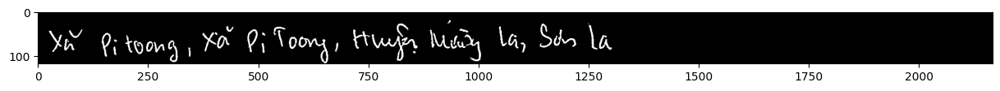

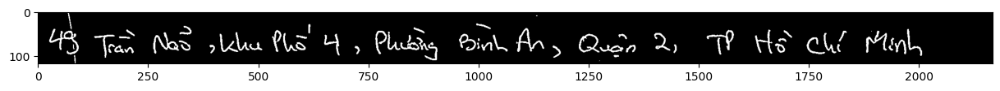

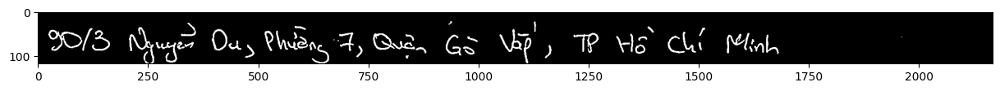

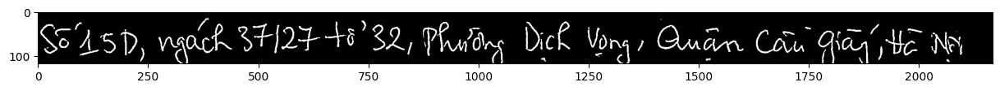

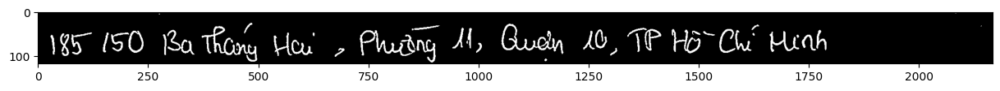

In [22]:
import matplotlib.pyplot as plt
for i in range(5):
    plt.figure(figsize=(15,2))
    plt.imshow(training_img[i][:,:,0], cmap="gray")
    plt.show()

In [23]:
# Tạo danh sách để lưu tập dữ liệu kiểm tra (validation)
valid_img = []  # Danh sách lưu ảnh đã xử lý
valid_txt = []  # Danh sách lưu nhãn của ảnh (dạng số hóa)
valid_input_length = []  # Danh sách lưu độ dài đầu vào của mô hình
valid_label_length = []  # Danh sách lưu độ dài của nhãn thực tế
valid_orig_txt = []  # Danh sách lưu nhãn gốc (chưa mã hóa)

i = 0  # Biến đếm số lượng ảnh đã xử lý

# Lặp qua từng ảnh trong tập validation
for val_img_path in val_image_paths:
    # Đọc ảnh từ đường dẫn và chuyển sang ảnh xám (grayscale)
    img = cv2.cvtColor(cv2.imread(val_img_path), cv2.COLOR_BGR2GRAY)

    # Resize ảnh về chiều cao 118, giữ nguyên tỉ lệ chiều rộng
    img = cv2.resize(img, (int(118 / height * width), 118))

    # Cập nhật giá trị lớn nhất của chiều rộng nếu cần
    if img.shape[1] > resize_max_width:
        resize_max_width = img.shape[1]

    # Đệm thêm vào ảnh để tất cả ảnh có cùng chiều rộng (2167)
    img = np.pad(img, ((0, 0), (0, 2167 - width)), 'median')

    # Làm mờ ảnh bằng bộ lọc Gaussian để giảm nhiễu
    img = cv2.GaussianBlur(img, (5, 5), 0)

    # Áp dụng ngưỡng thích nghi để làm nổi bật chữ viết tay
    img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 4)

    # Thêm một kênh cho ảnh (chuyển từ (H, W) thành (H, W, 1))
    img = np.expand_dims(img, axis=2)

    # Chuẩn hóa giá trị pixel về khoảng [0,1] để giúp mô hình học tốt hơn
    img = img / 255.

    # Lấy nhãn của ảnh từ từ điển đường dẫn - nhãn
    label = dict_filepath_label[val_img_path]

    # Lưu nhãn gốc (dạng text) vào danh sách
    valid_orig_txt.append(label)

    # Lưu độ dài của nhãn vào danh sách
    valid_label_length.append(len(label))

    # Lưu số bước thời gian của đầu vào vào danh sách
    valid_input_length.append(TIME_STEPS)

    # Lưu ảnh đã xử lý vào danh sách
    valid_img.append(img)

    # Chuyển nhãn từ dạng chữ thành dạng số dựa vào danh sách ký tự
    valid_txt.append(encode_to_labels(label))

    # Tăng biến đếm và in thông báo mỗi 500 ảnh đã xử lý
    i += 1
    if i % 500 == 0:
        print("Đã xử lý {} ảnh trong tập kiểm tra".format(i))

# In ra giá trị lớn nhất của chiều rộng ảnh sau khi xử lý
print(resize_max_width)

2167


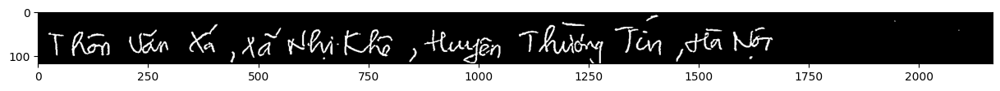

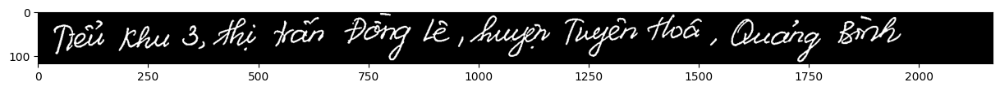

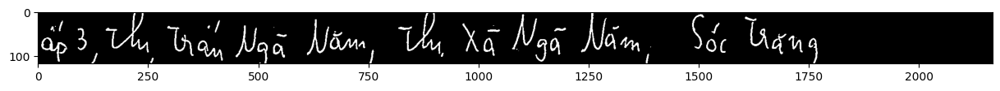

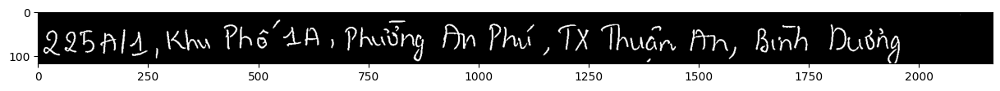

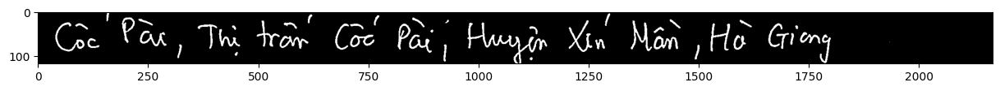

In [24]:
import matplotlib.pyplot as plt
for i in range(5):
    plt.figure(figsize=(15,2))
    plt.imshow(valid_img[i][:,:,0], cmap="gray")
    plt.show()

In [25]:
# Đây là phần gây tranh cãi nhất: max_label_len có thể được đặt nhỏ hơn hoặc khác TIME_STEPS
# Nhưng để giữ cách tiếp cận thông thường, ta đặt max_label_len bằng TIME_STEPS
max_label_len = TIME_STEPS

In [26]:
# Import thư viện để xử lý padding
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Thực hiện padding các nhãn đầu ra để có độ dài bằng max_label_len
train_padded_txt = pad_sequences(training_txt, maxlen=max_label_len, padding='post', value=0)
valid_padded_txt = pad_sequences(valid_txt, maxlen=max_label_len, padding='post', value=0)

In [27]:
train_padded_txt[0]

array([ 44,  76,   0,  36,  53,   0,  63,  58,  58,  57,  51,   6,   0,
        44,  76,   0,  36,  53,   0,  40,  58,  58,  57,  51,   6,   0,
        28,  64,  68, 113,  57,   0,  33,  96, 124,  57,  51,   0,  32,
        46,   6,   0,  39,  95,  57,   0,  32,  46,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   

In [28]:
from tensorflow.keras.layers import Dense, LSTM, Reshape, BatchNormalization, Input, Conv2D, MaxPool2D, Lambda, Bidirectional, Add, Activation
from tensorflow.keras.models import Model
from tensorflow.keras.activations import relu, sigmoid, softmax
import tensorflow.keras.backend as K
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import CSVLogger, TensorBoard, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

In [ ]:
# Định nghĩa đầu vào với kích thước ảnh (118, 2167, 1) - ảnh xám có chiều cao 118 và chiều rộng 2167
inputs = Input(shape=(118, 2167, 1))

# Block 1 - Lớp Convolutional đầu tiên trích xuất đặc trưng
x = Conv2D(64, (3,3), padding='same')(inputs)  # Lớp tích chập với 64 bộ lọc kích thước 3x3
x = MaxPool2D(pool_size=3, strides=3)(x)  # Lớp pooling giảm kích thước đặc trưng
x = Activation('relu')(x)  # Hàm kích hoạt ReLU
x_1 = x  # Lưu lại đầu ra của block 1

# Block 2 - Lớp Convolutional thứ hai
x = Conv2D(128, (3,3), padding='same')(x)
x = MaxPool2D(pool_size=3, strides=3)(x)
x = Activation('relu')(x)
x_2 = x  # Lưu lại đầu ra của block 2

# Block 3 - Tăng số lượng filters lên 256
x = Conv2D(256, (3,3), padding='same')(x)
x = BatchNormalization()(x)  # Chuẩn hóa batch để ổn định huấn luyện
x = Activation('relu')(x)
x_3 = x  # Lưu lại đầu ra của block 3

# Block 4 - Thêm residual connection giúp mô hình học tốt hơn
x = Conv2D(256, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = Add()([x, x_3])  # Cộng đầu ra với block 3
x = Activation('relu')(x)
x_4 = x

# Block 5 - Tiếp tục tăng số lượng filters lên 512
x = Conv2D(512, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x_5 = x

# Block 6 - Thêm residual connection giúp thông tin truyền sâu hơn
x = Conv2D(512, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = Add()([x, x_5])
x = Activation('relu')(x)

# Block 7 - Tăng lên 1024 bộ lọc, kết hợp MaxPooling để giảm chiều cao
x = Conv2D(1024, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = MaxPool2D(pool_size=(3, 1))(x)  # Pooling theo chiều cao
x = Activation('relu')(x)

# Tiếp tục giảm chiều cao bằng MaxPooling
x = MaxPool2D(pool_size=(3, 1))(x)

# Bỏ chiều đầu tiên để phù hợp với đầu vào của LSTM (từ (1, 9, 512) thành (9, 512))
squeezed = Lambda(lambda x: K.squeeze(x, 1))(x)

# LSTM bidirectional giúp mô hình hiểu dữ liệu theo cả hai hướng
blstm_1 = Bidirectional(LSTM(512, return_sequences=True, dropout=0.2))(squeezed)
blstm_2 = Bidirectional(LSTM(512, return_sequences=True, dropout=0.2))(blstm_1)

# Lớp đầu ra sử dụng softmax để tính xác suất của từng ký tự
outputs = Dense(len(char_list)+1, activation='softmax')(blstm_2)

# Xây dựng mô hình
model = Model(inputs, outputs)

In [ ]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 118, 2167, 1)   │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 118, 2167, 64)  │            640 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 39, 722, 64)    │              0 │ conv2d[0][0]           │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 39, 722, 64)    │              0 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 39, 722, 128)   │         73,856 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 13, 240, 128)   │              0 │ conv2d_1[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 13, 240, 128)   │              0 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 13, 240, 256)   │        295,168 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 13, 240, 256)   │          1,024 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 13, 240, 256)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 13, 240, 256)   │        590,080 │ activation_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 13, 240, 256)   │          1,024 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 13, 240, 256)   │              0 │ batch_normalization_1… │
│                           │                        │                │ activation_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 13, 240, 256)   │              0 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 13, 240, 512)   │      1,180,160 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 13, 240, 512)   │          2,048 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_4 (Activat

 Total params: 21,965,197 (83.79 MB)

 Trainable params: 21,960,077 (83.77 MB)

 Non-trainable params: 5,120 (20.00 KB)

In [31]:
### Định nghĩa hàm CTC (Connectionist Temporal Classification)
"""
CTC giúp xử lý chuỗi có độ dài thay đổi mà không cần phải căn chỉnh thủ công.
Chúng ta sử dụng ctc_batch_cost thay vì ctc_cost để tự động bỏ qua phần đệm (padding).
"""

# Định nghĩa đầu vào cho nhãn (labels) của mô hình CTC
labels = Input(name='the_labels', shape=[max_label_len], dtype='float32')

"""
input_length và label_length được sử dụng để xác định độ dài thực của đầu vào và đầu ra.
Điều này giúp loại bỏ các giá trị đệm khi tính toán loss bằng CTC.
"""

# Định nghĩa độ dài của chuỗi đầu vào và đầu ra cho CTC
input_length = Input(name='input_length', shape=[1], dtype='int64')
label_length = Input(name='label_length', shape=[1], dtype='int64')

# Hàm CTC Lambda để tính toán loss
# Hàm này nhận vào các tham số và trả về chi phí CTC batch

def ctc_lambda_func(args):
    y_pred, labels, input_length, label_length = args  # Tách các đầu vào
    """
    labels: Nhãn thực tế của dữ liệu (dạng tensor).
    y_pred: Dự đoán đầu ra của mạng (dạng tensor).
    input_length: Độ dài thực tế của từng mẫu trong y_pred.
    label_length: Độ dài thực tế của từng mẫu trong labels.
    """
    return K.ctc_batch_cost(labels, y_pred, input_length, label_length)  # Tính toán loss CTC

# Hàm tính loss sử dụng Lambda để gọi ctc_batch_cost
loss_out = Lambda(ctc_lambda_func, output_shape=(1,), name='ctc')([outputs, labels, input_length, label_length])

# Mô hình huấn luyện sử dụng CTC loss
model = Model(inputs=[inputs, labels, input_length, label_length], outputs=loss_out)


In [ ]:
# Biên dịch mô hình với hàm mất mát CTC và trình tối ưu hóa Adam
model.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer='adam')

# Thiết lập các callbacks để theo dõi và tối ưu hóa quá trình huấn luyện
callbacks = [
    TensorBoard(  # Callback để ghi lại thông tin huấn luyện cho TensorBoard
        log_dir='./logs',  # Thư mục lưu trữ log
        histogram_freq=10,  # Tần suất cập nhật biểu đồ trọng số (mỗi 10 epochs)
        profile_batch=0,  # Tắt profiling để tăng tốc độ
        write_graph=True,  # Ghi lại kiến trúc mạng
        write_images=False,  # Không ghi hình ảnh trọng số
        update_freq="epoch"  # Cập nhật sau mỗi epoch
    ),
    ModelCheckpoint(  # Callback để lưu mô hình tốt nhất dựa trên tập validation
        filepath=os.path.join('model_weights.hdf5'),  # Đường dẫn lưu mô hình
        monitor='val_loss',  # Giám sát giá trị loss trên tập validation
        save_best_only=True,  # Chỉ lưu khi có mô hình tốt hơn
        save_weights_only=False,  # Lưu toàn bộ mô hình, không chỉ trọng số
        verbose=1  # Hiển thị thông báo khi lưu mô hình
    ),
    EarlyStopping(  # Dừng sớm nếu mô hình không cải thiện
        monitor='val_loss',  # Theo dõi giá trị loss của tập validation
        min_delta=1e-8,  # Ngưỡng tối thiểu để xem xét sự cải thiện
        patience=20,  # Số epoch tối đa để chờ trước khi dừng
        restore_best_weights=True,  # Phục hồi trọng số tốt nhất sau khi dừng
        verbose=1  # Hiển thị thông báo khi dừng sớm
    ),
    ReduceLROnPlateau(  # Giảm tốc độ học nếu loss không cải thiện
        monitor='val_loss',  # Theo dõi giá trị loss của tập validation
        min_delta=1e-8,  # Ngưỡng tối thiểu để xem xét sự cải thiện
        factor=0.2,  # Giảm learning rate theo hệ số này
        patience=10,  # Số epoch tối đa để chờ trước khi giảm
        verbose=1  # Hiển thị thông báo khi giảm learning rate
    )
]

# Gán danh sách callbacks vào biến để sử dụng khi huấn luyện mô hình
callbacks_list = callbacks

In [33]:
model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 118, 2167, 1)   │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 118, 2167, 64)  │            640 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 39, 722, 64)    │              0 │ conv2d[0][0]           │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 39, 722, 64)    │              0 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 39, 722, 128)   │         73,856 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 13, 240, 128)   │              0 │ conv2d_1[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 13, 240, 128)   │              0 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 13, 240, 256)   │        295,168 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 13, 240, 256)   │          1,024 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 13, 240, 256)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 13, 240, 256)   │        590,080 │ activation_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 13, 240, 256)   │          1,024 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 13, 240, 256)   │              0 │ batch_normalization_1… │
│                           │                        │                │ activation_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 13, 240, 256)   │              0 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 13, 240, 512)   │      1,180,160 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 13, 240, 512)   │          2,048 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_4 (Activat

 Total params: 21,965,197 (83.79 MB)

 Trainable params: 21,960,077 (83.77 MB)

 Non-trainable params: 5,120 (20.00 KB)

In [ ]:
# Chuyển đổi dữ liệu ảnh huấn luyện thành NumPy array để dễ dàng thao tác 
training_img = np.array(training_img)  

# Chuyển đổi độ dài đầu vào của chuỗi đặc trưng thành NumPy array (độ dài mỗi chuỗi có thể khác nhau) 
train_input_length = np.array(train_input_length)  

# Chuyển đổi độ dài thực tế của nhãn thành NumPy array (dùng trong CTC Loss) 
train_label_length = np.array(train_label_length)  

# Chuyển đổi dữ liệu ảnh xác thực (validation) thành NumPy array để dùng trong quá trình đánh giá mô hình 
valid_img = np.array(valid_img)  

# Chuyển đổi độ dài đầu vào của dữ liệu validation (cần thiết để tính toán loss chính xác)  
valid_input_length = np.array(valid_input_length)  

# Chuyển đổi độ dài thực tế của nhãn validation thành NumPy array (vì mỗi nhãn có thể có độ dài khác nhau)  
valid_label_length = np.array(valid_label_length)

In [ ]:
batch_size = 32
epochs = 50

history = model.fit(x=[training_img, train_padded_txt, train_input_length, train_label_length],
          y=np.zeros(len(training_img)),
          batch_size=batch_size,
          epochs = epochs,
          validation_data = ([valid_img, valid_padded_txt, valid_input_length, valid_label_length], [np.zeros(len(valid_img))]),
          verbose = 1, callbacks = callbacks_list)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/serialization_lib.py:390: UserWarning: The object being serialized includes a `lambda`. This is unsafe. In order to reload the object, you will have to pass `safe_mode=False` to the loading function. Please avoid using `lambda` in the future, and use named Python functions instead. This is the `lambda` being serialized: model.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer = 'adam')

  return {key: serialize_keras_object(value) for key, value in obj.items()}


Epoch 1/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 359.8509
Epoch 1: val_loss improved from inf to 249.12788, saving model to model.keras
46/46 ━━━━━━━━━━━━━━━━━━━━ 135s 2s/step - loss: 358.1351 - val_loss: 249.1279 - learning_rate: 0.0010
Epoch 2/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 224.1425
Epoch 2: val_loss did not improve from 249.12788
46/46 ━━━━━━━━━━━━━━━━━━━━ 88s 2s/step - loss: 224.0473 - val_loss: 264.4671 - learning_rate: 0.0010
Epoch 3/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 189.9214
Epoch 3: val_loss improved from 249.12788 to 225.14410, saving model to model.keras
46/46 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step - loss: 189.7320 - val_loss: 225.1441 - learning_rate: 0.0010
Epoch 4/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 160.6700
Epoch 4: val_loss improved from 225.14410 to 164.61340, saving model to model.keras
46/46 ━━━━━━━━━━━━━━━━━━━━ 71s 2s/step - loss: 160.5574 - val_loss: 164.6134 - learning_rate: 0.0010
Epoch 5/50
46/46 ━━━━━━━━━━━━━━━━━━━

In [ ]:
model.load_weights('/content/model_weights.hdf5')

In [ ]:
# predict outputs on validation images
NO_PREDICTS = 100
OFFSET=0

prediction = model.predict(valid_img)

12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 475ms/step


In [ ]:
prediction.shape

(368, 240, 141)

In [39]:
# use CTC decoder
out = K.get_value(K.ctc_decode(prediction, input_length=np.ones(prediction.shape[0])*prediction.shape[1],
                         greedy=True)[0][0])
# see the results
all_predictions =[]
i = 0
for x in out:
    print("original_text  = ", valid_orig_txt[i+OFFSET])
    print("predicted text = ", end = '')
    pred = ""
    for p in x:
        if int(p) != -1:
            pred += char_list[int(p)]
    print(pred)
    all_predictions.append(pred)
    i+=1

original_text  =  Thôn Văn Xá, Xã Nhị Khê, Huyện Thường Tín, Hà Nội
predicted text = Tôn Văn Xá, Xã Nho Khê, Huyện Thường Tín, Hà Nội
original_text  =  Tiểu khu 3, Thị trấn Đồng Lê, Huyện Tuyên Hoá, Quảng Bình
predicted text = Trầu Khu 3, thị trấn Đồng Lê, Huyện Tuyên Hoà, Quảng Bình
original_text  =  ấp 3, Thị Trấn Ngã Năm, Thị Xã Ngã Năm, Sóc Trăng
predicted text = ấp 3, Thị Trấn Ngã Nam, Thị Xã Ngã Nâm, Sóc Trăng
original_text  =  225A/1, Khu Phố 1A, Phường An Phú, TX Thuận An, Bình Dương
predicted text = 225A/1, Khu phố 1A, Phường An Phú, TX Thuận An, Bình Dương
original_text  =  Cốc Pài, Thị trấn Cốc Pài, Huyện Xín Mần, Hà Giang
predicted text = Cả Pùi, Thị trấn Cò Pái, Huyện Yên Nôn, Hà Giang
original_text  =  Thôn Yên Trung, Xã Yên Bình, Huyện Quang Bình, Hà Giang
predicted text = Thôn Yên Trung, Xã Yên Bình, Huyện Quang Bình, Hà Giang
original_text  =  101 phố Láng Hạ, phường Láng hạ, Phường Láng Hạ, Quận Đống đa, Hà Nội
predicted text = 101 phố Láng Hạ, Phường Láng ha, Phường 

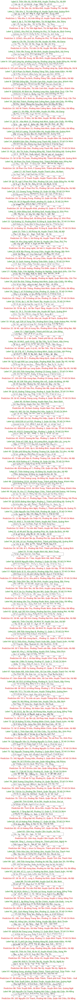

In [40]:
#YOUR PART: WRITE TO PRINT OUT THE IMAGES IN NICE 2D ARRAY PLOT WITH ORIGINAL TEXT AND PREDICTED TEXT
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.figure(figsize=(10,200))
col=0
row=1
gs1 = gridspec.GridSpec(NO_PREDICTS, 1)
# gs1.update(wspace=0.025, hspace=0.025)
for n in range(NO_PREDICTS):
    plt.subplot(gs1[n])
    plt.imshow(valid_img[n][:,:,0], cmap="gray_r")
    plt.title(f"Label {n}: "+valid_orig_txt[n+OFFSET], fontsize=20, color="green")
    plt.xlabel(f"Prediction {n}: "+all_predictions[n+OFFSET], fontsize=20, color="red")

In [41]:
!pip install editdistance


In [42]:
import string
import unicodedata
import editdistance


def ocr_metrics(predicts, ground_truth, norm_accentuation=False, norm_punctuation=False):
    """Calculate Character Error Rate (CER), Word Error Rate (WER) and Sequence Error Rate (SER)"""

    if len(predicts) == 0 or len(ground_truth) == 0:
        return (1, 1, 1)

    cer, wer, ser = [], [], []

    for (pd, gt) in zip(predicts, ground_truth):

        if norm_accentuation:
            pd = unicodedata.normalize("NFKD", pd).encode("ASCII", "ignore").decode("ASCII")
            gt = unicodedata.normalize("NFKD", gt).encode("ASCII", "ignore").decode("ASCII")

        if norm_punctuation:
            pd = pd.translate(str.maketrans("", "", string.punctuation))
            gt = gt.translate(str.maketrans("", "", string.punctuation))

        pd_cer, gt_cer = list(pd.lower()), list(gt.lower())
        dist = editdistance.eval(pd_cer, gt_cer)
        cer.append(dist / (max(len(pd_cer), len(gt_cer))))

        pd_wer, gt_wer = pd.lower().split(), gt.lower().split()
        dist = editdistance.eval(pd_wer, gt_wer)
        wer.append(dist / (max(len(pd_wer), len(gt_wer))))

        pd_ser, gt_ser = [pd], [gt]
        dist = editdistance.eval(pd_ser, gt_ser)
        ser.append(dist / (max(len(pd_ser), len(gt_ser))))

    cer_f = sum(cer) / len(cer)
    wer_f = sum(wer) / len(wer)
    ser_f = sum(ser) / len(ser)

    return (cer_f, wer_f, ser_f)

In [43]:
evaluate = ocr_metrics(predicts=all_predictions,
                                  ground_truth=valid_orig_txt,
                                  norm_accentuation=False,
                                  norm_punctuation=False)

e_corpus = "\n".join([
    "Metrics:",
    "Character Error Rate: {}".format(evaluate[0]),
    "Word Error Rate:      {}".format(evaluate[1]),
    "Sequence Error Rate:  {}".format(evaluate[2]),
])

In [44]:
print(e_corpus)


Metrics:
Character Error Rate: 0.05950652661071776
Word Error Rate:      0.1843082036516342
Sequence Error Rate:  0.8505434782608695


In [45]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [46]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>